In [2]:
import os

path = os.getcwd()

for dirpath,dirname,filename in os.walk(path):
    for d in dirname:
        #print(d)
        if d == 'wine':
            path = os.path.join(dirpath,d)
            for _ , _, f_names in os.walk(path):
                for  f in f_names:
                    print(os.path.join(path,f))

    


d:\实验室\实验\jupyter_notebook\data_analysis\wine\winemag-data-130k-v2.csv
d:\实验室\实验\jupyter_notebook\data_analysis\wine\winemag-data_first150k.csv


Nan number of country column in dataset 0: 63
The number of unique is 43
Unique word :US, frequency :54504, ratio :41.96%
Unique word :France, frequency :22093, ratio :17.01%
Unique word :Italy, frequency :19540, ratio :15.04%
Unique word :Spain, frequency :6645, ratio :5.12%
Unique word :Portugal, frequency :5691, ratio :4.38%

Nan number of description column in dataset 0: 0
The number of unique is 119955
Unique word :Cigar box, café au lait, and dried tobacco aromas are followed by coffee and cherry flavors, with barrel spices lingering on the finish. The wood gets a bit out front but it still delivers enjoyment., frequency :3, ratio :0.00%
Unique word :Gravenstein apple, honeysuckle and jasmine aromas show on the relatively boisterous nose of this bottling from a large vineyard on Highway 46 east of Paso Robles. There is compellingly grippy texture to the sip, with ripe flavors of pear and honeydew melon. A salty acidity takes it to the next level., frequency :3, ratio :0.00%
Uniqu

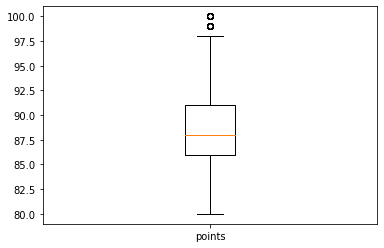

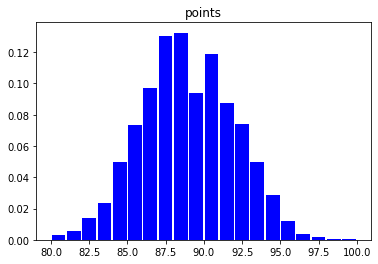


strategy to handle nan value is: delete
percentile:  [   4.   17.   25.   42. 3300.]
mean value:  35.363389129985535
std : 41.02204811941006



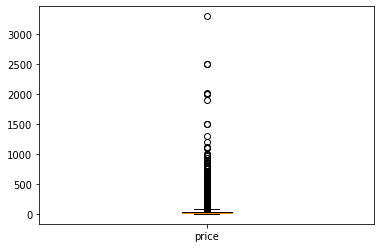

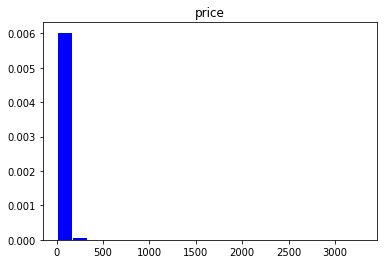


strategy to handle nan value is: delete
percentile:  [ 80.  86.  88.  90. 100.]
mean value:  87.8884184721394
std : 3.2223810838459586



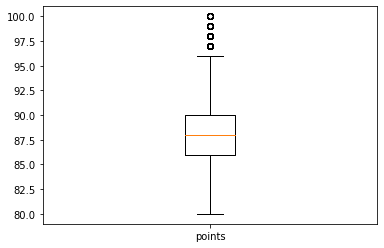

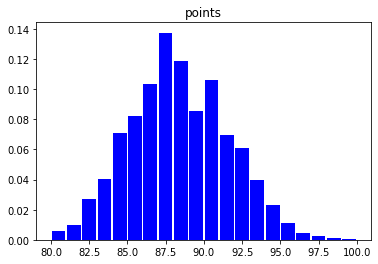


strategy to handle nan value is: delete
percentile:  [   4.   16.   24.   40. 2300.]
mean value:  33.13148249353299
std : 36.32240385925089



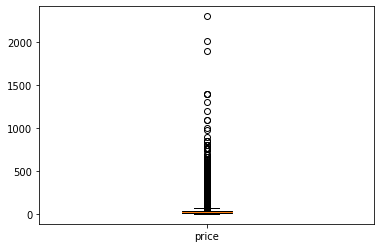

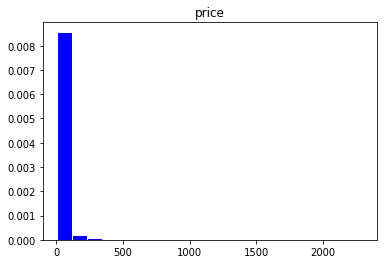


strategy to handle nan value is: delete
percentile:  [   4.   17.   25.   42. 3300.]
mean value:  35.363389129985535
std : 41.02204811941006



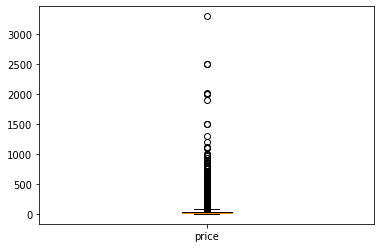

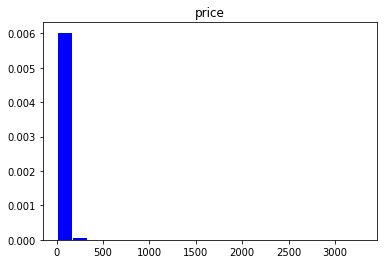


strategy to handle nan value is: mode
percentile:  [   4.   18.   25.   40. 3300.]
mean value:  34.30000538581684
std : 39.76856168522036



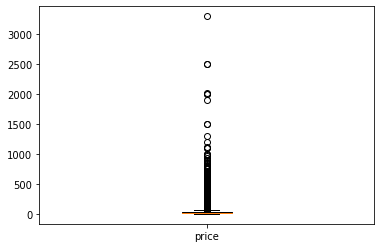

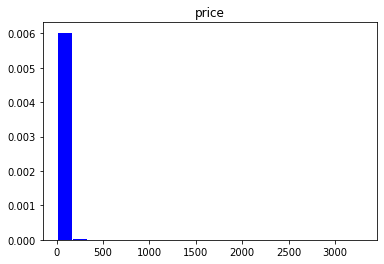


strategy to handle nan value is: relation
percentile:  [   4.   18.   25.   40. 3300.]
mean value:  34.30000538581684
std : 39.76856168522036



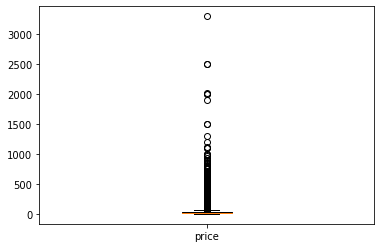

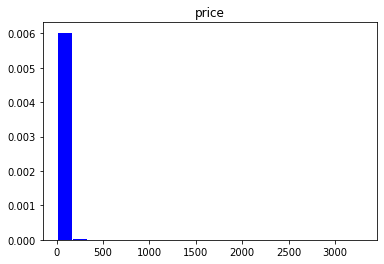


strategy to handle nan value is: delete
percentile:  [   4.   16.   24.   40. 2300.]
mean value:  33.13148249353299
std : 36.32240385925089



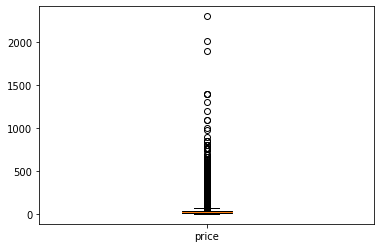

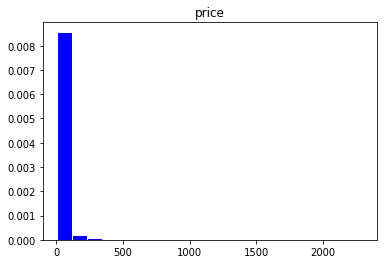


strategy to handle nan value is: mode
percentile:  [   4.   16.   22.   38. 2300.]
mean value:  31.93996554694229
std : 34.84009558213645



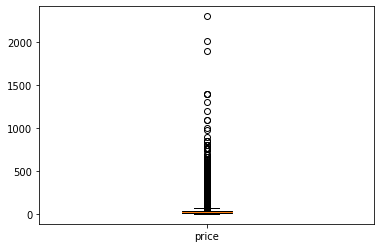

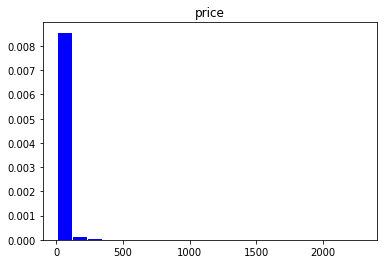


strategy to handle nan value is: relation
percentile:  [   4.   16.   22.   38. 2300.]
mean value:  31.93996554694229
std : 34.84009558213645



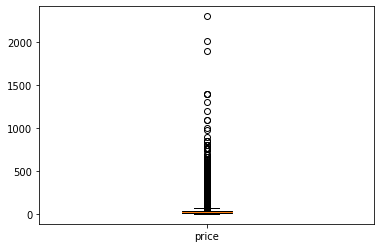

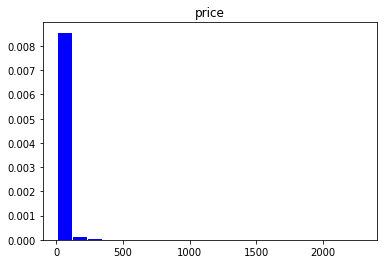

In [3]:
from data_handle import Data
import pandas as pd
import os

path = os.getcwd()

data_list = []
for d,d_name,f_name in os.walk(path):
    for directory in d_name:
        if directory == 'wine':
            path = os.path.join(d,directory)
            for _, _, files in os.walk(path):
                for f in files:
                    file_path = os.path.join(path,f)
                    is_csv = file_path.split('.')[1]
                    if is_csv == 'csv':
                        data_frame = pd.read_csv(file_path)
                        data_list.append(data_frame)



data_index = ['points','price']
data_desc = Data(dataset=data_list,data_index=data_index)

index = [['country', 'description', 'designation', 'points',
       'price', 'province', 'region_1', 'region_2', 'taster_name',
       'taster_twitter_handle', 'title', 'variety', 'winery'],
       ['country', 'description', 'designation', 'points',
       'price', 'province', 'region_1', 'region_2', 'variety', 'winery']]



for i in range(len(data_desc)):
    for ind in index[i]:
        data_desc.summary(i,ind)

for i in range(len(data_desc)):
    for ind in data_index:
        data_desc.visualization(i,ind)


nan_index = ['price']


for i in range(len(data_desc)):
    for ind in nan_index:
        data_desc.nan_choice(1)
        data_desc.visualization(i,ind)
        data_desc.nan_choice(2)
        data_desc.visualization(i,ind)
        data_desc.nan_choice(3)
        data_desc.visualization(i,ind)



In [64]:
#review
candidate = {}

for attr in data_desc.dataset[0].columns:
    attribute = data_desc.dataset[0][attr]
    #print('Null number: ', attribute.isnull().sum())
    if attribute.isnull().sum() == 0 and attr != 'Unnamed: 0':
        print(attribute.describe())
        average_count = attribute.count() / len(attribute.unique())
        candidate[attr] = average_count
        print()

print(candidate)

count     129971
unique        43
top           US
freq       54567
Name: country, dtype: object

count                                                129971
unique                                               119955
top       Gravenstein apple, honeysuckle and jasmine aro...
freq                                                      3
Name: description, dtype: object

count    129971.000000
mean         88.447138
std           3.039730
min          80.000000
25%          86.000000
50%          88.000000
75%          91.000000
max         100.000000
Name: points, dtype: float64

count    129971.000000
mean         34.300005
std          39.768715
min           4.000000
25%          18.000000
50%          25.000000
75%          40.000000
max        3300.000000
Name: price, dtype: float64

count         129971
unique           425
top       California
freq           36310
Name: province, dtype: object

count                                                129971
unique                    

In [45]:
pattern_attr = []
for key,value in candidate.items():
    if value > 150 :
        pattern_attr.append(key)

print(pattern_attr)

dataset = data_desc.dataset[0]
#ready to preprocess to apply relative pattern mining
#to disjoint two continuous variable price and points, delete some identities that ensuring these two attributes have no #overlapping area in terms of value.
dataset = dataset.drop(dataset[dataset['price'] >= 80].index)
# length:122730
dataset['price'] = dataset['price'].astype('str')
dataset['points'] = dataset['points'].astype('str')
transaction = []

for ind in dataset.index:
    node = []

    for attr in pattern_attr:
        node.append(dataset.loc[ind][attr])
    
    transaction.append(node)

print(transaction[:5])


['country', 'points', 'price', 'province', 'variety']
[['Italy', '87', '20.0', 'Sicily & Sardinia', 'White Blend'], ['Portugal', '87', '15.0', 'Douro', 'Portuguese Red'], ['US', '87', '14.0', 'Oregon', 'Pinot Gris'], ['US', '87', '13.0', 'Michigan', 'Riesling'], ['US', '87', '65.0', 'Oregon', 'Pinot Noir']]


In [55]:
from mlxtend.frequent_patterns import fpgrowth,association_rules
from mlxtend.preprocessing import TransactionEncoder

te = TransactionEncoder()
te_ary = te.fit(transaction).transform(transaction)
dataframe = pd.DataFrame(te_ary,columns=te.columns_)

frequent_itemsets = fpgrowth(dataframe, min_support=0.05, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.146761,(Italy)
1,0.136356,(87)
2,0.129846,(20.0)
3,0.422635,(US)
4,0.100383,(Pinot Noir)
5,0.051373,(Spain)
6,0.166316,(France)
7,0.277699,(California)
8,0.064964,(Cabernet Sauvignon)
9,0.091803,(Chardonnay)


In [66]:
rules = association_rules(frequent_itemsets,metric='confidence',min_threshold=0.4)
rules['kulc'] = (rules['support']/rules['antecedent support'] + 
rules['support']/rules['consequent support'])/2
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,kulc
0,(Pinot Noir),(US),0.100383,0.422635,0.076949,0.766558,1.813760,0.034524,2.473274,0.474315
1,(Pinot Noir),(California),0.100383,0.277699,0.053940,0.537338,1.934964,0.026063,1.561184,0.365788
2,"(Pinot Noir, US)",(California),0.076949,0.277699,0.053940,0.700974,2.524223,0.032571,2.415514,0.447606
3,"(California, Pinot Noir)",(US),0.053940,0.422635,0.053940,1.000000,2.366108,0.031143,inf,0.563813
4,(Pinot Noir),"(California, US)",0.100383,0.277699,0.053940,0.537338,1.934964,0.026063,1.561184,0.365788
5,(California),(US),0.277699,0.422635,0.277699,1.000000,2.366108,0.160334,inf,0.828533
6,(US),(California),0.422635,0.277699,0.277699,0.657066,2.366108,0.160334,2.106237,0.828533
7,(Chardonnay),(US),0.091803,0.422635,0.054991,0.599006,1.417313,0.016191,1.439834,0.364560
8,(Washington),(US),0.068467,0.422635,0.068467,1.000000,2.366108,0.039531,inf,0.581001
9,(88),(US),0.137578,0.422635,0.056237,0.408765,0.967182,-0.001908,0.976541,0.270914


id                                0.199024
host_id                           0.133518
neighbourhood_group                    NaN
latitude                          0.084138
longitude                        -0.035335
price                            -0.030808
minimum_nights                   -0.052131
number_of_reviews                 0.624661
reviews_per_month                 1.000000
calculated_host_listings_count    0.089790
availability_365                  0.078894
Name: reviews_per_month, dtype: float64
Nan number of name column in dataset 0: 3
The number of unique is 22449
Unique word :Home away from home, frequency :15, ratio :0.07%
Unique word :1 Bedroom Suite in Melbourne CBD - 7 Nights, frequency :11, ratio :0.05%
Unique word :Domi Rentals - The Carlisle Apartments, frequency :11, ratio :0.05%
Unique word :Melbourne Single family home, frequency :10, ratio :0.04%
Unique word :Elegant Garden Retreat, frequency :8, ratio :0.03%

Nan number of host_name column in dataset 0: 3
The

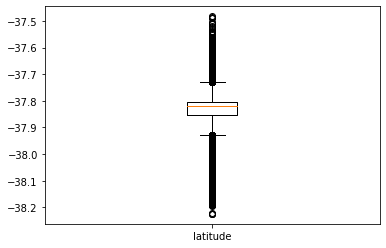

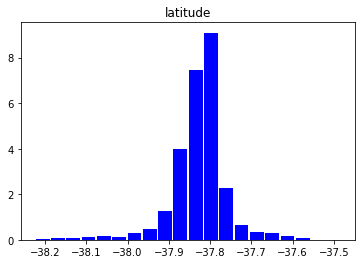


strategy to handle nan value is: delete
percentile:  [144.48432558 144.95769226 144.97840166 145.01344118 145.83912686]
mean value:  145.0084571248067
std : 0.1277078352572577



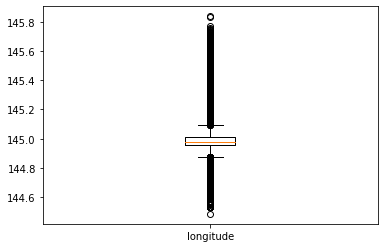

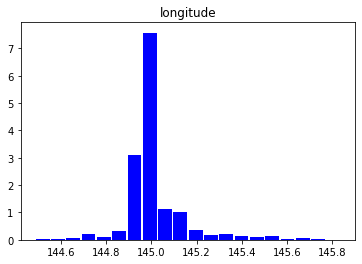


strategy to handle nan value is: delete
percentile:  [    0.    71.   111.   165. 12624.]
mean value:  148.00436776588774
std : 210.87864766956585



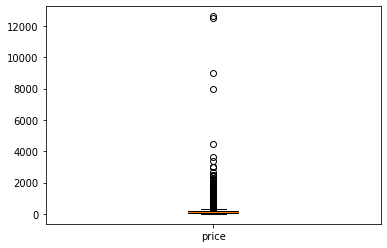

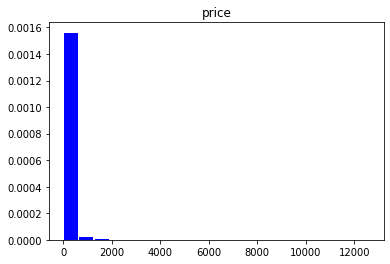


strategy to handle nan value is: delete
percentile:  [1.000e+00 1.000e+00 2.000e+00 3.000e+00 1.125e+03]
mean value:  4.059314260755624
std : 25.88269221569806



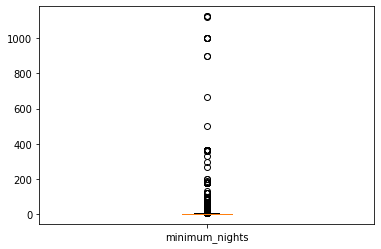

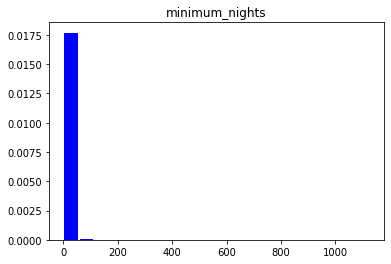


strategy to handle nan value is: delete
percentile:  [  0.    1.    5.   23.5 538. ]
mean value:  21.26647739681153
std : 39.01275415475755



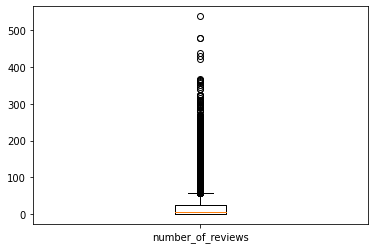

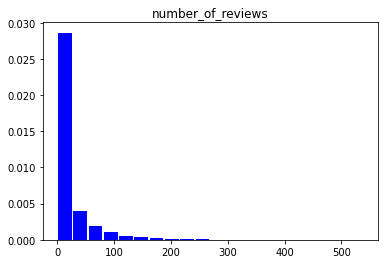


strategy to handle nan value is: delete
percentile:  [1.000e-02 3.000e-01 1.000e+00 2.290e+00 1.454e+01]
mean value:  1.5905415510111596
std : 1.7240690648955415



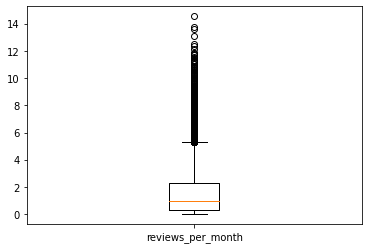

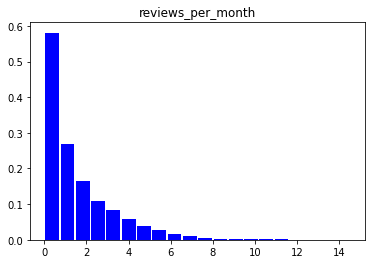


strategy to handle nan value is: delete
percentile:  [ 1.  1.  1.  4. 98.]
mean value:  7.125791657567154
std : 15.637462535532189



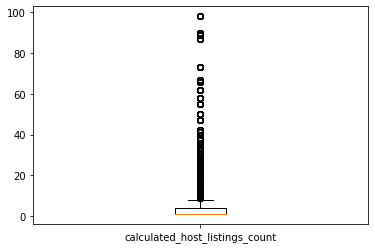

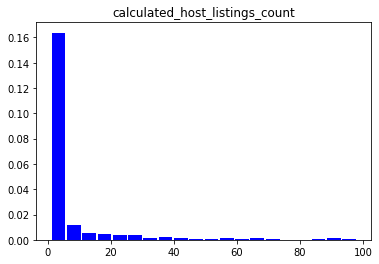


strategy to handle nan value is: delete
percentile:  [  0.   4.  88. 276. 365.]
mean value:  135.1470626774405
std : 133.32327611046244



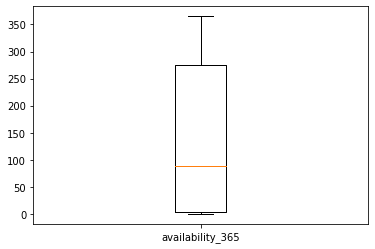

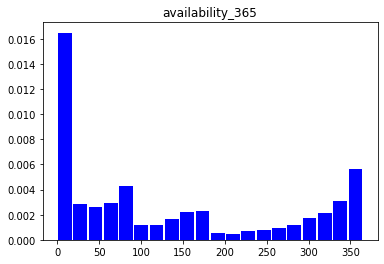


strategy to handle nan value is: delete
percentile:  [1.000e-02 3.000e-01 1.000e+00 2.290e+00 1.454e+01]
mean value:  1.5905415510111596
std : 1.7240690648955415



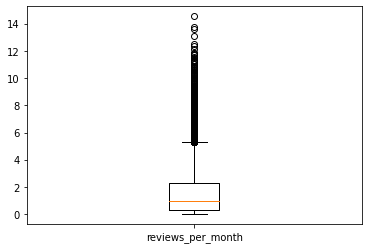

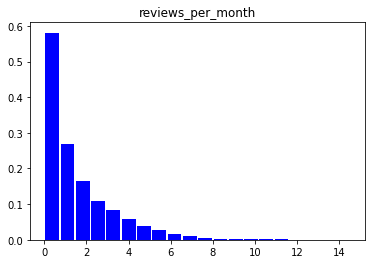


strategy to handle nan value is: mode
percentile:  [1.000e-02 4.600e-01 1.000e+00 1.810e+00 1.454e+01]
mean value:  1.4553321685957634
std : 1.5340862001481355



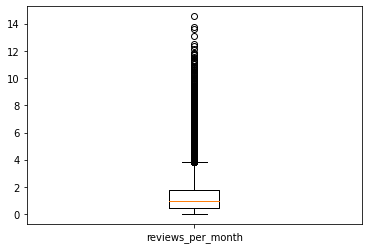

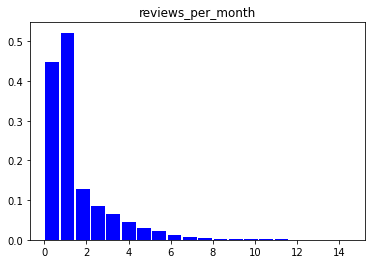


strategy to handle nan value is: relation_airbnb
percentile:  [1.000e-02 4.600e-01 1.000e+00 1.810e+00 1.454e+01]
mean value:  1.4553321685957634
std : 1.5340862001481355



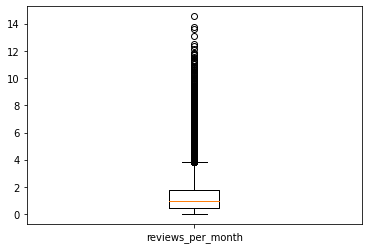

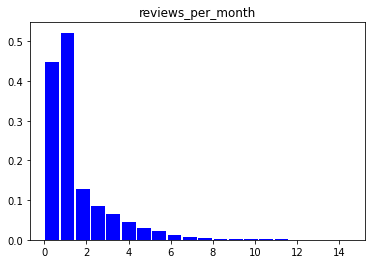


strategy to handle nan value is: similarity_airbnb
percentile:  [1.000e-02 4.600e-01 1.000e+00 1.810e+00 1.454e+01]
mean value:  1.4553321685957634
std : 1.5340862001481355



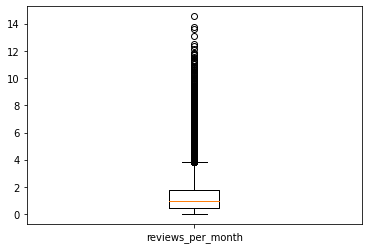

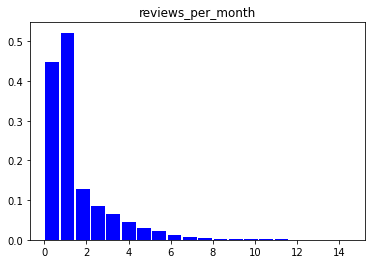

In [2]:
from data_handle import Data
import pandas as pd
import os

path = os.getcwd()

data_list = []
for d,d_name,f_name in os.walk(path):
    for directory in d_name:
        if directory == 'airbnb':
            path = os.path.join(d,directory)
            for _, _, files in os.walk(path):
                for f in files:
                    file_path = os.path.join(path,f)
                    is_csv = file_path.split('.')[1]
                    if is_csv == 'csv':
                        data_frame = pd.read_csv(file_path)
                        data_list.append(data_frame)
                        print(data_frame.corr()['reviews_per_month'])
                        

data_index = ['latitude','longitude','price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']

airbnb_data = Data(dataset = data_list,data_index = data_index)

index = ['name','host_name','neighbourhood','latitude','longitude','room_type','price',
'minimum_nights','number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count','availability_365']

for i in range(len(airbnb_data)):
    for ind in index:
        airbnb_data.summary(i,ind)

for i in range(len(airbnb_data)):
    for ind in data_index:
        airbnb_data.visualization(i,ind)

nan_index = ['reviews_per_month']


for i in range(len(airbnb_data)):
    for ind in nan_index:
        airbnb_data.nan_choice(1)
        airbnb_data.visualization(i,ind)
        airbnb_data.nan_choice(2)
        airbnb_data.visualization(i,ind)
        airbnb_data.nan_choice(5)
        airbnb_data.visualization(i,ind)
        airbnb_data.nan_choice(6)
        airbnb_data.visualization(i,ind)



